## Importing Libraries

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import root_mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import pickle

## Reading Dataset

In [2]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
submission = pd.read_csv('sample_submission.csv')

## EDA

In [3]:
print('Showing the first 5 rows in train data:--')
train.head()

Showing the first 5 rows in train data:--


,id,age,gender,course,study_hours,class_attendance,internet_access,sleep_hours,sleep_quality,study_method,facility_rating,exam_difficulty,exam_score
0,0,21,female,b.sc,7.91,98.8,no,4.9,average,online videos,low,easy,78.3
1,1,18,other,diploma,4.95,94.8,yes,4.7,poor,self-study,medium,moderate,46.7
2,2,20,female,b.sc,4.68,92.6,yes,5.8,poor,coaching,high,moderate,99.0
3,3,19,male,b.sc,2.00,49.5,yes,8.3,average,group study,high,moderate,63.9
4,4,23,male,bca,7.65,86.9,yes,9.6,good,self-study,high,easy,100.0


In [4]:
print('Showing the first 5 rows in test data:--')
test.head()

Showing the first 5 rows in test data:--


,id,age,gender,course,study_hours,class_attendance,internet_access,sleep_hours,sleep_quality,study_method,facility_rating,exam_difficulty
0,630000,24,other,ba,6.85,65.2,yes,5.2,poor,group study,high,easy
1,630001,18,male,diploma,6.61,45.0,no,9.3,poor,coaching,low,easy
2,630002,24,female,b.tech,6.60,98.5,yes,6.2,good,group study,medium,moderate
3,630003,24,male,diploma,3.03,66.3,yes,5.7,average,mixed,medium,moderate
4,630004,20,female,b.tech,2.03,42.4,yes,9.2,average,coaching,low,moderate


In [5]:
tr_cols = train.columns
tr_cols = tr_cols.drop(['id', 'age','exam_score'])
tr_cols

Index(['gender', 'course', 'study_hours', 'class_attendance',
       'internet_access', 'sleep_hours', 'sleep_quality', 'study_method',
       'facility_rating', 'exam_difficulty'],
      dtype='object')

In [6]:
train.describe()

,id,age,study_hours,class_attendance,sleep_hours,exam_score
count,630000.000000,630000.000000,630000.000000,630000.000000,630000.000000,630000.000000
mean,314999.500000,20.545821,4.002337,71.987261,7.072758,62.506672
std,181865.479132,2.260238,2.359880,17.430098,1.744811,18.916884
min,0.000000,17.000000,0.080000,40.600000,4.100000,19.599000
25%,157499.750000,19.000000,1.970000,57.000000,5.600000,48.800000
50%,314999.500000,21.000000,4.000000,72.600000,7.100000,62.600000
75%,472499.250000,23.000000,6.050000,87.200000,8.600000,76.300000
max,629999.000000,24.000000,7.910000,99.400000,9.900000,100.000000


In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 630000 entries, 0 to 629999
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                630000 non-null  int64  
 1   age               630000 non-null  int64  
 2   gender            630000 non-null  object 
 3   course            630000 non-null  object 
 4   study_hours       630000 non-null  float64
 5   class_attendance  630000 non-null  float64
 6   internet_access   630000 non-null  object 
 7   sleep_hours       630000 non-null  float64
 8   sleep_quality     630000 non-null  object 
 9   study_method      630000 non-null  object 
 10  facility_rating   630000 non-null  object 
 11  exam_difficulty   630000 non-null  object 
 12  exam_score        630000 non-null  float64
dtypes: float64(4), int64(2), object(7)
memory usage: 62.5+ MB


In [8]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 270000 entries, 0 to 269999
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                270000 non-null  int64  
 1   age               270000 non-null  int64  
 2   gender            270000 non-null  object 
 3   course            270000 non-null  object 
 4   study_hours       270000 non-null  float64
 5   class_attendance  270000 non-null  float64
 6   internet_access   270000 non-null  object 
 7   sleep_hours       270000 non-null  float64
 8   sleep_quality     270000 non-null  object 
 9   study_method      270000 non-null  object 
 10  facility_rating   270000 non-null  object 
 11  exam_difficulty   270000 non-null  object 
dtypes: float64(3), int64(2), object(7)
memory usage: 24.7+ MB


From train and test info ,There is not Null Values in Train And Test DataSet.

In [9]:
print('The Shape of train :-\n',train.shape)

The Shape of train :-
 (630000, 13)


In [10]:
print('The Shape of test :-\n',test.shape)

The Shape of test :-
 (270000, 12)


In [11]:
print('Checking for duplicate values in train data:-\n',train.duplicated().sum())

Checking for duplicate values in train data:-
 0


In [12]:
print('Checking for duplicate values in test data:-\n',test.duplicated().sum())

Checking for duplicate values in test data:-
 0


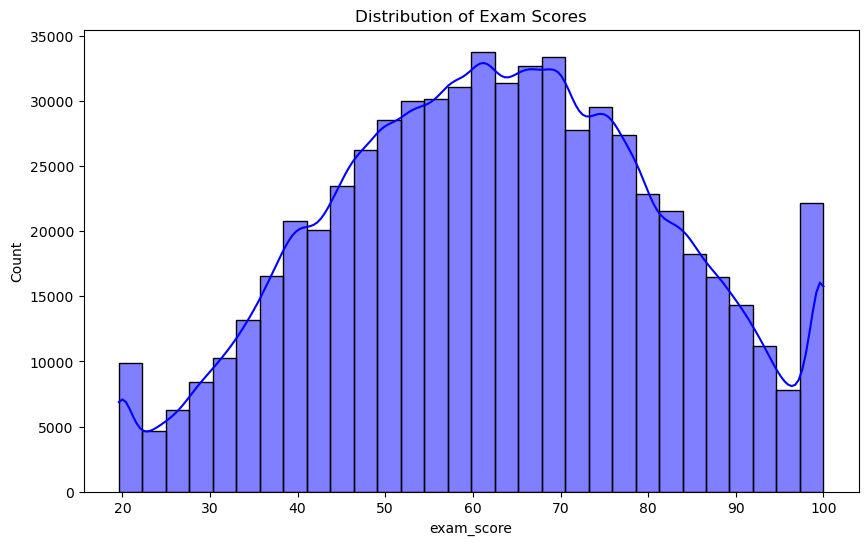

In [13]:
plt.figure(figsize=(10,6))
sns.histplot(train,x='exam_score',kde=True,color='blue',bins=30)
plt.title('Distribution of Exam Scores')
plt.show()

In [14]:
for col in train.select_dtypes('object').columns:
    print(f'Value counts for {col} in train data:-\n{train[col].value_counts()}\n')

Value counts for gender in train data:-
gender
other     211097
male      210593
female    208310
Name: count, dtype: int64

Value counts for course in train data:-
course
b.tech     131236
b.sc       111554
b.com      110932
bca         88721
bba         75644
ba          61989
diploma     49924
Name: count, dtype: int64

Value counts for internet_access in train data:-
internet_access
yes    579423
no      50577
Name: count, dtype: int64

Value counts for sleep_quality in train data:-
sleep_quality
poor       213675
good       213089
average    203236
Name: count, dtype: int64

Value counts for study_method in train data:-
study_method
coaching         131697
self-study       131131
mixed            123086
group study      123009
online videos    121077
Name: count, dtype: int64

Value counts for facility_rating in train data:-
facility_rating
medium    214082
low       212378
high      203540
Name: count, dtype: int64

Value counts for exam_difficulty in train data:-
exam_difficulty

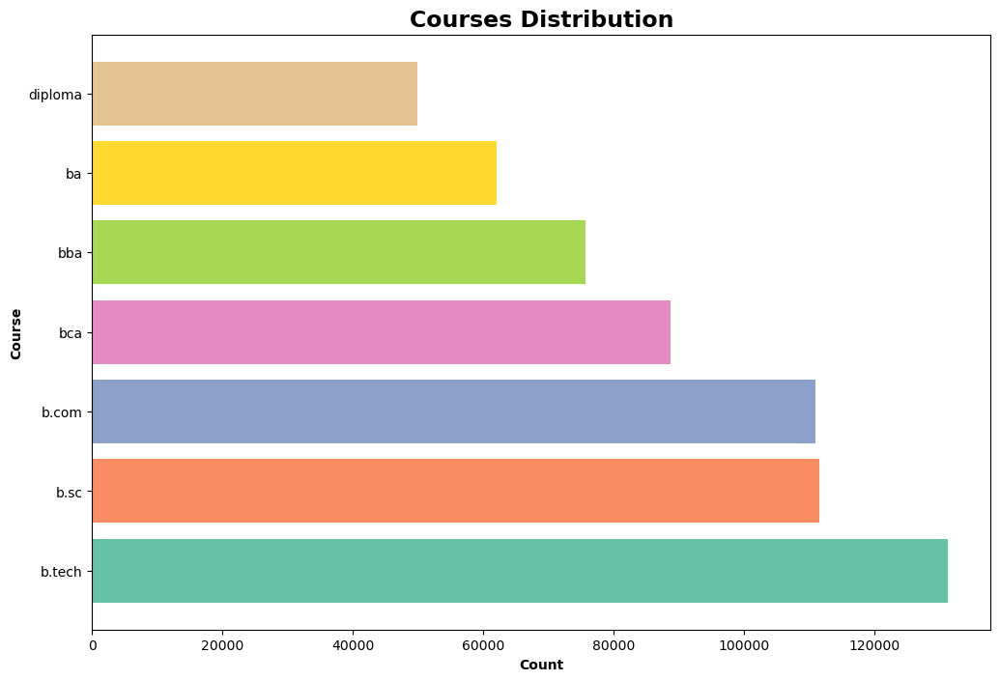

In [15]:
counts = train['course'].value_counts()

plt.figure(figsize=(12,8))
plt.barh(
    counts.index,
    counts.values,
    color=plt.cm.Set2(range(len(counts)))
)
plt.xlabel('Count',fontweight='bold')
plt.ylabel('Course',fontweight='bold')
plt.title('Courses Distribution',fontsize=17,fontweight='bold')

plt.show()

In [16]:
fig = px.pie(
    train,
    names='gender',
    title='Gender Distribution'
)
fig.update_layout(
    title_x=0.5
)

fig.show()

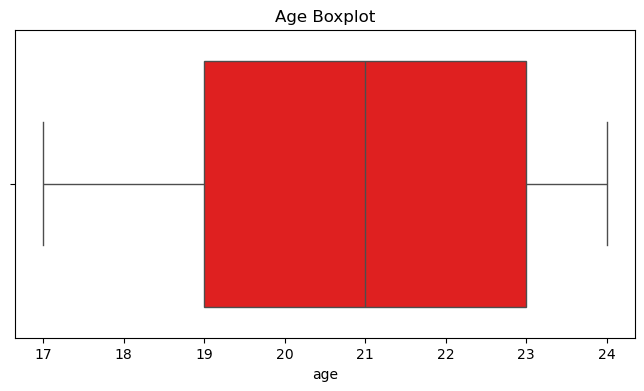

In [17]:
plt.figure(figsize=(8,4))
sns.boxplot(x=train['age'], color='red')
plt.title('Age Boxplot')
plt.show()


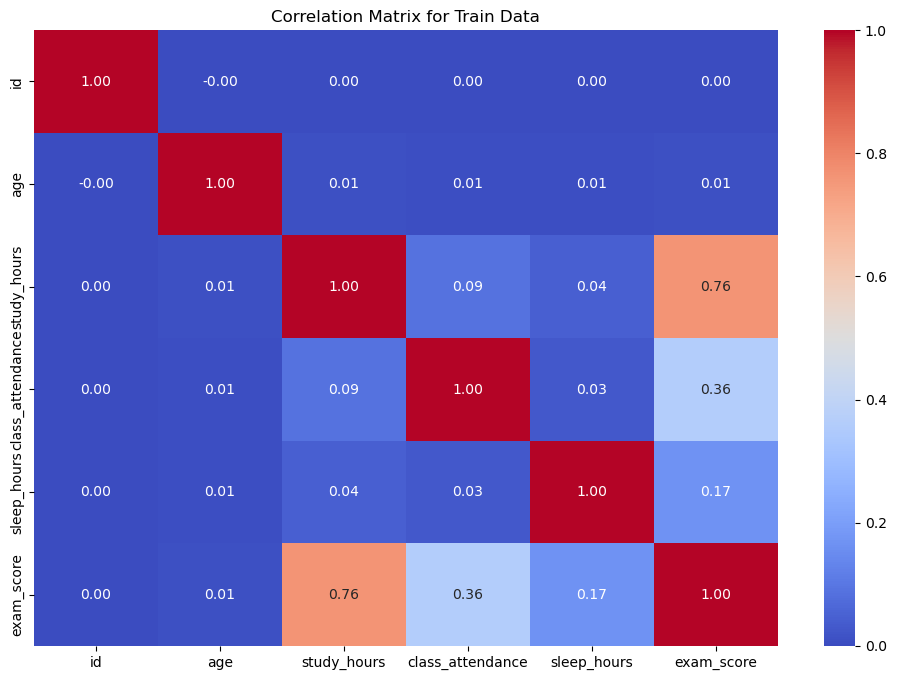

In [18]:
numeric_cols = train.select_dtypes('number').columns
corr = train[numeric_cols].corr()
plt.figure(figsize=(12,8))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix for Train Data')
plt.show()

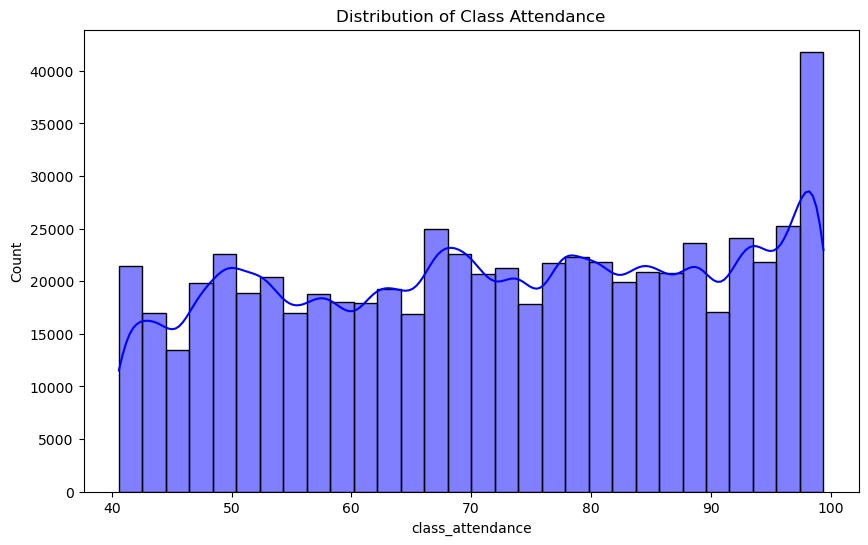

In [19]:
plt.figure(figsize=(10,6))
sns.histplot(train,x='class_attendance',kde=True,color='blue',bins=30)
plt.title('Distribution of Class Attendance')
plt.show()

## Preprocessing

In [20]:
le_encoders = {}
cols = ['gender','facility_rating','exam_difficulty','internet_access','sleep_quality']

for col in cols:
    le = LabelEncoder()
    train[col] = le.fit_transform(train[col])
    test[col]  = le.transform(test[col])
    le_encoders[col] = le   

# -------- One-Hot Encoding --------
ohe_encoders = {}
cols_to_encode = ['course','study_method']

for col in cols_to_encode:
    ohe = OneHotEncoder(sparse_output=False, drop='first', handle_unknown='ignore')

    train_encoded = ohe.fit_transform(train[[col]])
    test_encoded  = ohe.transform(test[[col]])

    train_df = pd.DataFrame(train_encoded, columns=ohe.get_feature_names_out([col]))
    test_df  = pd.DataFrame(test_encoded,  columns=ohe.get_feature_names_out([col]))

    train = pd.concat([train, train_df], axis=1)
    test  = pd.concat([test,  test_df],  axis=1)

    train.drop(col, axis=1, inplace=True)
    test.drop(col, axis=1, inplace=True)
    ohe_encoders[col] = ohe   

## Splitting Dataset

In [21]:
X = train.drop(columns=['exam_score','id','age'])
y = train['exam_score']

In [22]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=20)
print('Shape of X_train:', X_train.shape)
print('Shape of X_val:', X_val.shape)
print('Shape of y_train:', y_train.shape)
print('Shape of y_val:', y_val.shape)

Shape of X_train: (472500, 18)
Shape of X_val: (157500, 18)
Shape of y_train: (472500,)
Shape of y_val: (157500,)


In [23]:
scaler = MinMaxScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train),columns = X_train.columns)
X_val_scaled = pd.DataFrame(scaler.fit_transform(X_val),columns = X_val.columns)
test_scaled = pd.DataFrame(scaler.fit_transform(test),columns = test.columns)

In [24]:
test_scaled=test_scaled.drop(columns=['id','age'])

## Model


In [25]:
model = XGBRegressor(n_estimators=1000, learning_rate=0.1, max_depth=5, random_state=20)
model.fit(X_train_scaled, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.1, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=1000,
             n_jobs=None, num_parallel_tree=None, ...)

In [30]:
y_pred = model.predict(X_val_scaled)
rmse = root_mean_squared_error(y_val, y_pred)
print(f'Root Mean Squared Error on validation set: {rmse}')

Root Mean Squared Error on validation set: 8.751425453617854


In [27]:
predictions = model.predict(test_scaled)
print('Showing the first 5 predictions on test data:--')
print(predictions[:5])

Showing the first 5 predictions on test data:--
[71.81949  68.479836 88.10762  55.460197 48.465073]


## save model

In [31]:
train = train.drop(columns=['id','age','exam_score'], errors='ignore')
test  = test.drop(columns=['id','age','exam_score'], errors='ignore')

feature_cols = train.columns

import joblib

joblib.dump(
    {
        "model": model,
        "label_encoders": le_encoders,
        "onehot_encoders": ohe_encoders,
        "feature_cols": feature_cols
    },
    'model.joblib'
)



['model.joblib']